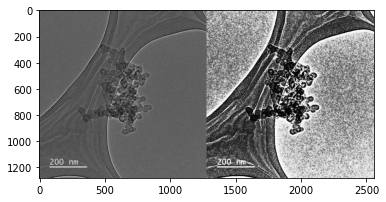

In [54]:
from skimage import data, io, color
import cv2
import tifffile
from skimage.exposure import histogram
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image as PImage
import IPython.display as ipd

coins = (cv2.imread('C:/Users/Laurence/Documents/GitHub/internship-code/testing/name4.jpg',0))
#print(coins)
coins = np.array(coins)
#coins = np.array(coins * 255./np.amax(coins), dtype=np.double)
#coins = cv2.equalizeHist(coins)
#print(coins)
plt.imshow(np.hstack((coins,cv2.equalizeHist(coins))),cmap='gray')
coins = cv2.equalizeHist(coins)

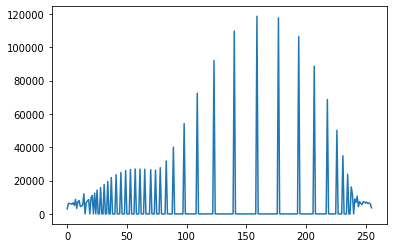

In [14]:
hist, hist_centers = histogram(coins)
ax = plt.plot(hist)
#print(hist_centers)

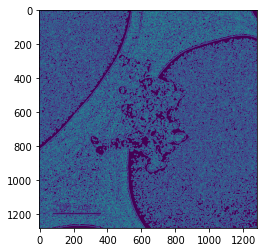

In [15]:
from skimage.feature import canny
edges = canny(coins)

from scipy import ndimage as ndi
fill_coins = ndi.binary_fill_holes(edges)
plt.imshow(edges)

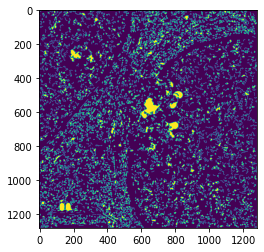

In [55]:
label_objects, nb_labels = ndi.label(fill_coins)
sizes = np.bincount(label_objects.ravel())
mask_sizes = sizes > 20
mask_sizes[0] = 0
coins_cleaned = mask_sizes[label_objects]

plt.imshow(coins_cleaned)

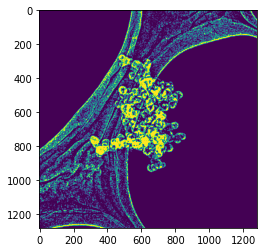

In [27]:
markers = np.zeros_like(coins)
common_boundary = 40
markers[coins > common_boundary] = 1
markers[coins < common_boundary] = 2
markers[coins < 10] = 3
plt.imshow(markers)

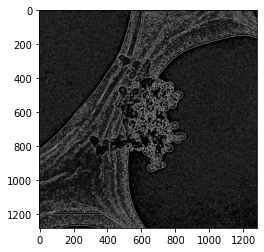

In [17]:
from skimage.filters import sobel
elevation_map = sobel(coins); plt.imshow(elevation_map,cmap='gray')

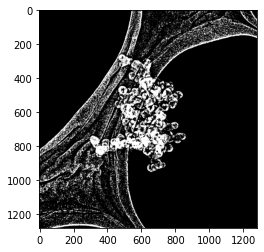

In [29]:
from skimage.segmentation import watershed
segmentation = watershed(elevation_map, markers)
plt.imshow(segmentation, cmap='gray')

a = np.zeros_like(segmentation)
a[segmentation == 2] = 255
a[segmentation == 3] = 255
a[segmentation == 1] = 0
a = ndi.binary_fill_holes(a)

plt.imshow(segmentation, cmap='gray')

In [83]:
segmentation = ndi.binary_fill_holes(segmentation - 1)
labeled_coins, _ = ndi.label(segmentation)

In [85]:
print(coins)

[[194 177 194 ... 218 218 218]
 [207 194 207 ... 194 194 177]
 [194 177 194 ... 218 207 194]
 ...
 [ 98 109  89 ... 218 218 218]
 [ 78 177 177 ... 226 226 226]
 [109 140  98 ... 231 231 235]]


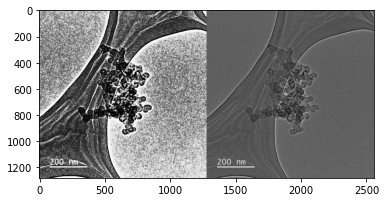

In [87]:
import cv2 

b = cv2.imread('C:/Users/Laurence/Documents/GitHub/internship-code/testing/name4.jpg',0)
a = cv2.equalizeHist(b)
c = np.hstack((a,b))


plt.imshow(c,cmap='gray')

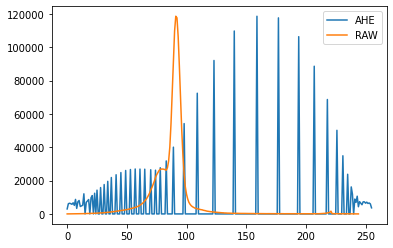

In [89]:
AHEhist, _ = histogram(a)
PREhist, _ = histogram(b)

plt.plot(AHEhist, label="AHE")
plt.plot(PREhist, label="RAW")
plt.legend()
plt.show()

In [57]:
ipd.Image(data=segmentation)